# Baixando dependências

In [1]:
%pip install numpy
%pip install matplotlib
%pip install scipy
%pip install soundfile
%pip install Ipython

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Importando bibliotecas

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import soundfile as sf
import IPython.display as ipd

# Posições dos pontos em metros

In [3]:
P1 = np.array([+1.5, -1.5])
P2 = np.array([+1.5, +1.5])
P3 = np.array([-1.5, +1.5])
P4 = np.array([-1.5, -1.5])
P5 = np.array([+0.7, -0.8])   # ponto alvo

pontos = [P1, P2, P3, P4]

# Salvando listas (uma para cada lado) das 4 respostas aos impulsos que já existem

In [11]:
resp_imp_esq = [np.genfromtxt('Arquivos/Medições/SEC_1.csv', delimiter=',')[:, 1] ,
                np.genfromtxt('Arquivos/Medições/SEC_2.csv', delimiter=',')[:, 1],
                np.genfromtxt('Arquivos/Medições/SEC_3.csv', delimiter=',')[:, 1],
                np.genfromtxt('Arquivos/Medições/SEC_4.csv', delimiter=',')[:, 1]]

resp_imp_dir = [np.genfromtxt('Arquivos/Medições/SEC_1.csv', delimiter=',')[:, 0] ,
                np.genfromtxt('Arquivos/Medições/SEC_2.csv', delimiter=',')[:, 0],
                np.genfromtxt('Arquivos/Medições/SEC_3.csv', delimiter=',')[:, 0],
                np.genfromtxt('Arquivos/Medições/SEC_4.csv', delimiter=',')[:, 0]]
fs = 44100

# Função para aplicar um delay fracionário a depender das distâncias

In [5]:

def deslocamento_temporal(resp_imp, fs, delay_s):
    """
    Aplica um atraso e retorna o sinal real no domínio do tempo com mesmo comprimento.
    """
    N = len(resp_imp)

    M = 1 << (int(np.ceil(np.log2(N))) + 1)  # próxima potência de 2 maior
    Hf = sp.fft.rfft(resp_imp, n = M)
    freqs = sp.fft.rfftfreq(M, d=1/fs)  # frequências
    # fator de fase para atraso
    fase = np.exp(-1j * 2 * np.pi * freqs * delay_s)
    Hf_alterada = Hf * fase
    resp_alterada = sp.fft.irfft(Hf_alterada, n = M)
    # retornar somente os "N" primeiros pontos
    return resp_alterada[: N]


# Calculando as distâncias dos 4 pontos até o ponto 5

In [6]:
dists = [np.linalg.norm(P5 - p) for p in pontos]

# Os pesos para as amplitudes serão iguais a $\frac{1}{d}$ uma vez que $$ A \propto \frac{1}{d} $$ 

In [7]:
pesos = np.array([1.0 / (d) for d in dists])
pesos /= np.sum(pesos)

# Calculando os atrasos relativos

In [8]:
# velocidade do som (m/s)
c = 343.0

centro = np.array([0.0, 0.0])
t_i = [np.linalg.norm(p - centro) / c for p in pontos] # tempo que leva de uma resposta de impulso até o centro
t_5 = np.linalg.norm(P5 - centro) / c # tempo que levaria de uma resposta no ponto 5 até o centro

# Salvando esses valores para alinhar os delays 

In [9]:
delays = [t_5 - ti for ti in t_i]  # positivo -> atrasar | negativo -> adiantar

# Aplicando os delays em todas as respostas aos impulsos

In [12]:
N = max(len(h) for h in resp_imp_esq)
resp_imp_5_esq = np.zeros(N)
resp_imp_5_dir = np.zeros(N)

for peso, delay, r_esq, r_dir in zip(pesos, delays, resp_imp_esq, resp_imp_dir):
    resp_esq_alterada = deslocamento_temporal(r_esq, fs, delay)  # delay em segundos
    resp_dir_alterada = deslocamento_temporal(r_dir, fs, delay)
    # aplicar peso
    resp_imp_5_esq[:len(resp_esq_alterada)] += peso * resp_esq_alterada
    resp_imp_5_dir[:len(resp_dir_alterada)] += peso * resp_dir_alterada


# Mostrando a resposta ao impulso simulada na posição 5

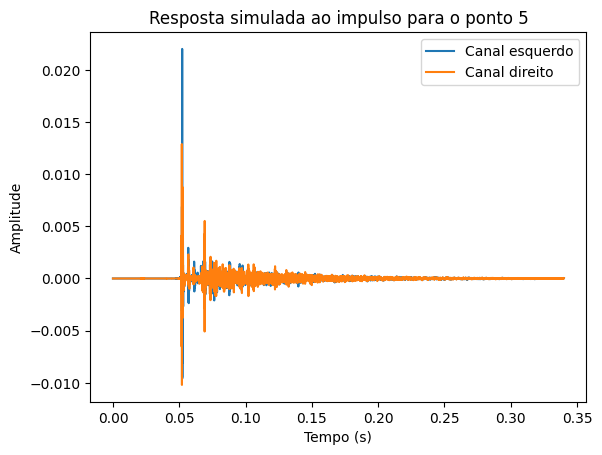

In [13]:
corte=15000
t=np.arange(0, min(len(resp_imp_5_esq[:corte]), len(resp_imp_5_dir[:corte])) * 1/fs, 1/fs)
plt.plot(t, resp_imp_5_esq[:corte], label='Canal esquerdo')
plt.plot(t, resp_imp_5_dir[:corte], label='Canal direito')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.title('Resposta simulada ao impulso para o ponto 5')
plt.legend()

# Unindo as respostas referentes a cada ouvido em uma só

In [14]:
resp_imp_5_simulada = np.vstack((resp_imp_5_esq, resp_imp_5_dir)).transpose()

# Salvando a resposta simulada

In [15]:
sf.write("Arquivos/Saídas/resposta_impulso_simulada_5.wav", resp_imp_5_simulada[:100000],fs)
ipd.Audio(filename='Arquivos/Saídas/resposta_impulso_simulada_5.wav',)

# Carregando o som do instrumento

In [16]:
canon_violin, fs = sf.read('Arquivos/Áudios/Canon_Violin.wav')
canon_violin.shape, fs

((2381400,), 44100)

# Aplicando a convolução

In [17]:
saida_pt3_esq = sp.signal.fftconvolve(canon_violin, resp_imp_5_simulada[:, 1])
saida_pt3_dir = sp.signal.fftconvolve(canon_violin, resp_imp_5_simulada[:, 0])

# Unindo em um só

In [18]:
saida_pt3 = np.vstack((saida_pt3_esq, saida_pt3_dir)).transpose()


# Mostrando a saída

/home/caio/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


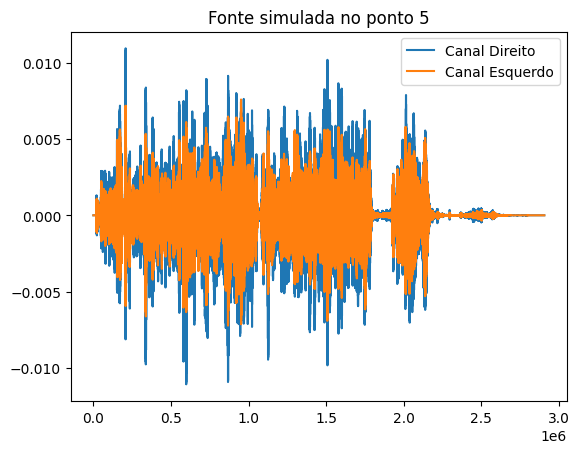

In [19]:
plt.plot(saida_pt3_dir, label="Canal Direito")
plt.plot(saida_pt3_esq, label="Canal Esquerdo")
plt.legend()
plt.title("Fonte simulada no ponto 5")
plt.show()

# Salvando o resultado

In [20]:
sf.write("Arquivos/Saídas/saida_pt3.wav", saida_pt3, fs)
ipd.Audio(filename='Arquivos/Saídas/saida_pt3.wav',)